In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import colorsys
import itertools as it
import pandas as pd
from pathlib import Path
from hypo_sleep import Session, NumpyDecoder
import spikeinterface.full as si
import spikeinterface.preprocessing as spp
from scipy import signal, stats
import xarray as xr
import statsmodels.api as sm
from functools import partial
from ghostipy.dsp import signal_envelope
import json

# from specparam import (
#     SpectralModel,
#     SpectralGroupModel,
#     SpectralTimeEventModel,
#     SpectralTimeModel,
# )

In [2]:
data_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
full_dict = {
    "none": {
        "dates": [
            "2024-05-21_10-28-00",
            "2024-05-23_06-00-36",
            "2024-07-22_10-47-00",
            "2024-07-23_05-47-21",
            "2024-07-23_12-06-25",
            "2024-07-25_05-55-34",
            "2024-07-25_12-18-59",
            "2025-02-18_09-19-26",
            "2025-02-20_08-58-57",
            "2025-03-20_09-01-41",
            "2025-02-24_09-00-29",
            # "2025-02-26_09-05-08",
        ],
        "configs": [
            "55a4",
            "929a",
            "3ad9",
            "20a7",
            "f9f7",
            "1f25",
            "70eb",
            "5d77",
            "790d",
            "8a55",
            "3e4b",
            # "d205",
        ],
        "animal": [
            "HYDO01",
            "HYDO01",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO02",
            "HYDO03",
            "HYDO03",
            "HYDO03",
            "HYDO04",
        ],  # "HYDO04"],
    },
    "sleep": {
        "dates": [
            "2025-02-19_08-59-23",
            "2025-03-03_08-55-10",
            "2025-02-25_09-06-23",
            "2025-03-07_08-52-44",
        ],
        "configs": [
            "d628",
            "c687",
            "073a",
            "9080",
        ],
        "animal": ["HYDO03", "HYDO03", "HYDO04", "HYDO04"],
    },
    "food": {
        "dates": [
            "2025-02-21_09-04-29",
            "2025-02-28_09-02-06",
            "2025-03-04_08-55-25",
        ],
        "configs": [
            "a964",
            "0674",
            "bc96",
        ],
        "animal": ["HYDO03", "HYDO03", "HYDO04"],
    },
}
depth_ordered_chs = {
    "HYDO01": np.array(
        [
            "14",
            "31",
            "1",
            "16",
            "13",
            "15",
            "2",
            "30",
            "0",
            "17",
            "12",
            "9",
            "3",
            "29",
            "6",
            "18",
            "11",
            "8",
            "4",
            "28",
            "7",
            "19",
            "25",
            "5",
            "26",
            "22",
            "21",
            "24",
            "20",
            "23",
        ]
    ),
    "HYDO02": np.array(
        [
            "14",
            "31",
            "1",
            "16",
            "13",
            "15",
            "2",
            "30",
            "0",
            "17",
            "12",
            "9",
            "3",
            "29",
            "6",
            "18",
            "11",
            "8",
            "4",
            "28",
            "7",
            "19",
            "25",
            "5",
            "26",
            "22",
            "21",
            "24",
            "20",
            "23",
        ]
    ),
    "HYDO03": np.array(
        [
            "24",
            "23",
            "25",
            "22",
            "8",
            "7",
            "9",
            "6",
            "15",
            "0",
            "14",
            "1",
            "26",
            "21",
            "27",
            "20",
            "10",
            "5",
            "28",
            "19",
            "11",
            "4",
            "29",
            "18",
            "12",
            "3",
            "30",
            "17",
            "13",
            "2",
            "31",
            "16",
        ]
    ),
    "HYDO04": np.array(
        [
            "24",
            "23",
            "25",
            "22",
            "8",
            "7",
            "9",
            "6",
            "15",
            "0",
            "14",
            "1",
            "26",
            "21",
            "27",
            "20",
            "10",
            "5",
            "28",
            "19",
            "11",
            "4",
            "29",
            "18",
            "12",
            "3",
            "30",
            "17",
            "13",
            "2",
            "31",
            "16",
        ]
    ),
}

In [3]:
animals_dict = full_dict["none"]
triggers = ["nrem-all", "rem-all", "wake-all"]
# state_data_dict = {
#     cond: {date: {trigger: {} for trigger in triggers} for date in meta_dict["dates"]}
#     for cond, meta_dict in full_dict.items()
# }
state_data_dict = {
    date: {trigger: {} for trigger in triggers} for date in animals_dict["dates"]
}
print("loading spectra")
# for cond, meta_dict in full_dict.items():
for animal, date, config_id in zip(
    animals_dict["animal"], animals_dict["dates"], animals_dict["configs"]
):
    tmp_output_path = Path(
        "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/",
        animal,
        date,
        config_id,
        "spectra",
    )
    for trigger, tmp_dict in state_data_dict[date].items():
        for region in ["ctx", "hyp"]:
            print(animal, date, trigger, region)
            load_path = Path(
                tmp_output_path,
                f"spectra_{trigger}_meth-gsp_mtm_psd_{region}_{config_id}.nc",
            )
            if load_path.exists():
                tmp_da = xr.load_dataarray(load_path, engine="h5netcdf")
                tmp_dict[region] = tmp_da
            else:
                tmp_dict[region] = None
                print(f"File not found: {load_path}")
                continue

loading spectra
HYDO01 2024-05-21_10-28-00 nrem-all ctx
HYDO01 2024-05-21_10-28-00 nrem-all hyp
HYDO01 2024-05-21_10-28-00 rem-all ctx
HYDO01 2024-05-21_10-28-00 rem-all hyp
HYDO01 2024-05-21_10-28-00 wake-all ctx
HYDO01 2024-05-21_10-28-00 wake-all hyp
HYDO01 2024-05-23_06-00-36 nrem-all ctx
HYDO01 2024-05-23_06-00-36 nrem-all hyp
HYDO01 2024-05-23_06-00-36 rem-all ctx
HYDO01 2024-05-23_06-00-36 rem-all hyp
HYDO01 2024-05-23_06-00-36 wake-all ctx
HYDO01 2024-05-23_06-00-36 wake-all hyp
HYDO02 2024-07-22_10-47-00 nrem-all ctx
HYDO02 2024-07-22_10-47-00 nrem-all hyp
HYDO02 2024-07-22_10-47-00 rem-all ctx
HYDO02 2024-07-22_10-47-00 rem-all hyp
HYDO02 2024-07-22_10-47-00 wake-all ctx
HYDO02 2024-07-22_10-47-00 wake-all hyp
HYDO02 2024-07-23_05-47-21 nrem-all ctx
HYDO02 2024-07-23_05-47-21 nrem-all hyp
HYDO02 2024-07-23_05-47-21 rem-all ctx
HYDO02 2024-07-23_05-47-21 rem-all hyp
HYDO02 2024-07-23_05-47-21 wake-all ctx
HYDO02 2024-07-23_05-47-21 wake-all hyp
HYDO02 2024-07-23_12-06-25 nrem-

In [4]:
config_path = Path("/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/")
session_dict = {}
animal_dict = full_dict["none"]
for animal, date, config_id in zip(
    animal_dict["animal"], animal_dict["dates"], animal_dict["configs"]
):
    with open(Path(config_path, animal, date, config_id, "state_dict.json"), "r") as f:
        state_dict = json.load(f, cls=NumpyDecoder)
    session_dict[date] = state_dict

In [7]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]


# psd_epoch_dict = {
#     cond: {
#         reg: {
#             state: {animal: None for animal in ["HYDO01", "HYDO02", "HYDO03", "HYDO04"]}
#             for state in ["nrem-all", "rem-all", "wake-all"]
#         }
#         for reg in ["ctx", "hyp"]
#     }
#     for cond in ["none", "sleep", "food"]
# }
psd_epoch_dict = {
    reg: {
        state: {animal: None for animal in ["HYDO01", "HYDO02", "HYDO03", "HYDO04"]}
        for state in ["nrem-all", "rem-all", "wake-all"]
    }
    for reg in ["ctx", "hyp"]
}
frames = []
# for cond, date_psd in state_data_dict.items():
for date, state_psd in state_data_dict.items():
    for state, reg_psd in state_psd.items():
        state_times = session_dict[date][state.split("-")[0].upper()]["times"].T
        for reg, data in reg_psd.items():
            animal = [
                animal
                for animal, tmp_date in zip(
                    animals_dict["animal"], animals_dict["dates"]
                )
                if tmp_date == date
            ][0]
            if data is None:
                continue
            data = data.set_index(trial="start")

            if reg == "ctx":
                data = data.sel(channel="39")  # LFP channel in cortex
            # if "start" in data.coords:
            #     data = data.drop_vars(
            #         [
            #             "start",
            #         ]
            #     )
            # if "stop" in data.coords:
            #     data = data.drop_vars(
            #         [
            #             "stop",
            #         ]
            #     )
            freq_res = data.freq[-1] - data.freq[-2]
            factor = int(0.5 / freq_res)
            epochs = [
                data.sel(trial=slice(start, stop - 10))
                .mean(dim="trial", skipna=True)
                .coarsen(freq=factor, boundary="trim", side="right")
                .mean()
                for start, stop in state_times
            ]
            good_epochs = [
                epoch
                for epoch in epochs
                if not xr.ufuncs.isnan(epoch).sum() == epoch.size
            ]
            # data = data.coarsen(freq=factor, boundary="trim", side="right").mean()
            state_data = xr.concat(good_epochs, dim="epoch")
            new_freqs = np.array(
                [
                    find_nearest(data.freq.values, tmp_val)
                    for tmp_val in state_data.freq.values
                ]
            )
            # state_data = state_data.assign_coords(freq=np.round(new_freqs, 4))
            psd_epoch_dict[reg][state][animal] = state_data
#                 df = data.to_dataframe(name="value").reset_index()
#                 df.freq = np.round(df.freq, 1)

#                 # Add metadata columns
#                 df["condition"] = cond
#                 df["region"] = reg
#                 df["state"] = state
#                 df["animal"] = animal

#                 frames.append(df)

#                 # cond_reg_dict[cond][reg][state].append(
#                 #     data.coarsen(freq=factor, boundary="exact").mean()
#                 # )
# df_all = pd.concat(frames, ignore_index=True)
# hyp_df = df_all.loc[(df_all.condition == "none") & (df_all.region == "hyp"), :]
# hyp_df = hyp_df.drop(columns=["region", "condition"], inplace=False)
# channels = hyp_df.channel.unique()
# freqs = hyp_df.freq.unique()
# hyp_df = hyp_df.set_index(
#     ["condition", "region", "state", "channel", "freq", "trial", "animal"]
# )

In [8]:
frames = []
psd_state_dict = psd_epoch_dict  # [cond]
for region, reg_data in psd_state_dict.items():
    for state, state_data in reg_data.items():
        for animal, animal_data in state_data.items():
            df = (
                animal_data.sel(freq=slice(0, 45))
                .to_dataframe(name="value")
                .reset_index()
            )
            # df.freq = np.round(df.freq, 3)
            # df["condition"] = cond
            df["region"] = region
            df["state"] = state
            df["animal"] = animal

            frames.append(df)
df_all = pd.concat(frames, ignore_index=True)

In [9]:
hyp_df = df_all.loc[df_all.region == "hyp", :].drop(columns=["region"], inplace=False)

In [10]:
hyp_df.head()

,epoch,freq,channel,value,state,animal
48150,0,0.495050,26,54.078217,nrem-all,HYDO01
48151,0,0.990099,26,38.942873,nrem-all,HYDO01
48152,0,1.485149,26,29.810632,nrem-all,HYDO01
48153,0,1.980198,26,15.606285,nrem-all,HYDO01
48154,0,2.475248,26,9.170748,nrem-all,HYDO01


In [11]:
state_df = (
    hyp_df.groupby(["freq", "state", "epoch"]).agg({"value": "mean"}).reset_index()
)

In [13]:
state_psds = {
    state: np.array(
        [
            state_df.loc[
                ((state_df.state == state) & (state_df.epoch == epoch)), :
            ].value
            for epoch in state_df.epoch.unique()
            if len(
                state_df.loc[
                    ((state_df.state == state) & (state_df.epoch == epoch)), :
                ].value
            )
            > 0
        ]
    )
    for state in ["nrem-all", "rem-all", "wake-all"]
}

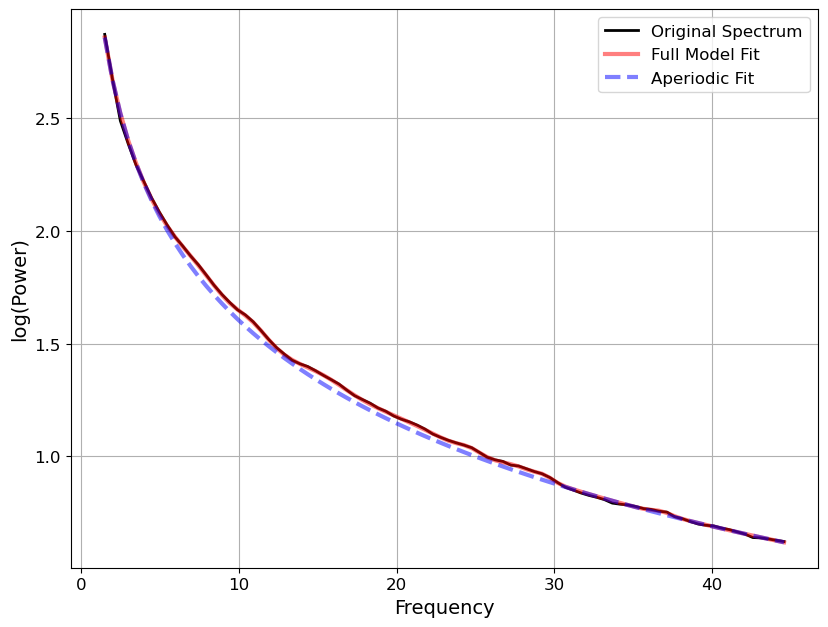

In [83]:
fm1 = fm.get_model(ind=10, regenerate=True)
fm1.plot()


	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

Fitting model across 14 power spectra.
                                                                                                  
                            GROUP SPECTRAL MODEL RESULTS (14 spectra)                             
                                                                                                  
                       The model was fit with the 'spectral_fit' algorithm                        
               Model was fit to the 1-45 Hz frequency range with 0.50 Hz resolution               
                                                                                                  
                               Aperiodic Parameters ('fixed' mode)                                
          

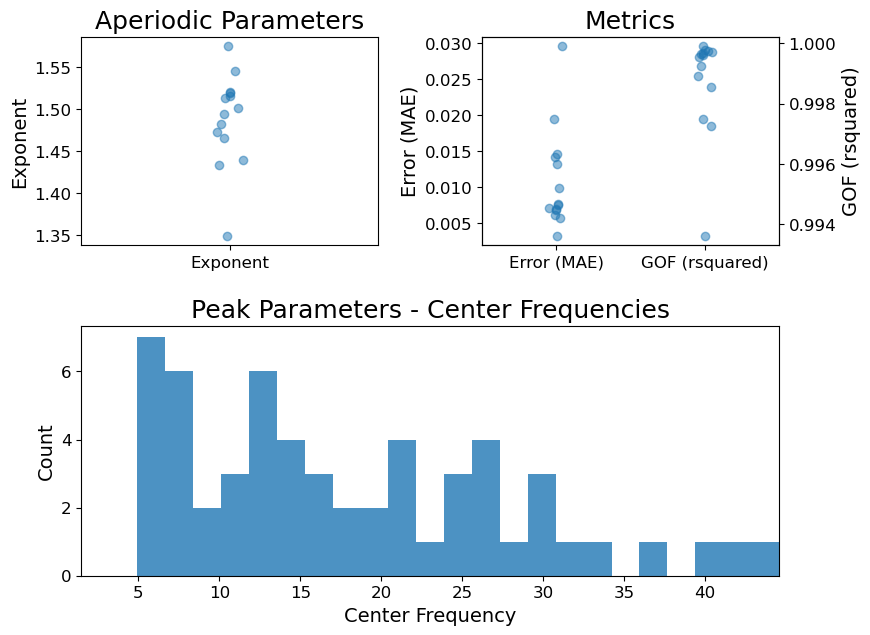

In [81]:
fm = SpectralGroupModel()
freq_range = [1, 45]
fm.report(state_df.freq.unique(), state_psds["rem-all"], freq_range)

In [20]:
mean_df = hyp_df.groupby(["state", "epoch", "freq", "animal"]).agg(
    {"value": np.nanmean}
)
mean_df = mean_df.reset_index()

In [40]:
mean_df.head()

,state,epoch,freq,animal,value
0,nrem-all,0,0.5,HYDO03,312.807880
1,nrem-all,0,0.5,HYDO04,560.916289
2,nrem-all,0,1.0,HYDO03,229.354143
3,nrem-all,0,1.0,HYDO04,506.464356
4,nrem-all,0,1.5,HYDO03,139.075757


In [24]:
idx = pd.IndexSlice
# hyp_df = df_all.loc[df_all.region == "hyp", :]
# channels = hyp_df.channel.unique()
freqs = mean_df.freq.unique()
# states = mean_df.state.unique()
# stat_res = xr.DataArray(data=np.nan, dims=["ch", "freq"], coords={"ch": channels, "freq": freqs})
# stat_res = xr.DataArray(data=np.nan, dims=["state"], coords={"state": states})
stat_res = {}
# ch_x_freq = list(it.product(channels, freqs))
for tmp_freq in freqs:
    # for tmp_state in states:
    tmp_df = mean_df.loc[(mean_df.freq == tmp_freq), :]
    # tmp_df = mean_df.loc[
    #     (mean_df.state == tmp_state),
    #     :,
    # ]
    # tmp_df = hyp_df
    model1 = sm.formula.mixedlm(
        "value ~ C(state, Treatment(reference='wake-all'))",  # * C(channel)",
        data=tmp_df,
        # vc_formula=vcf,
        groups=tmp_df.animal,
    ).fit(reml=False)
    model2 = sm.formula.mixedlm(
        "value ~ 1",  # C(state, Treatment(reference='wake-all')) + C(channel)",
        data=tmp_df,
        # vc_formula=vcf,
        groups=tmp_df.animal,
    ).fit(reml=False)
    # model3 = sm.formula.mixedlm(
    #     "value ~ C(state, Treatment(reference='wake-all'))",
    #     data=tmp_df,
    #     # vc_formula=vcf,
    #     groups=tmp_df.animal,
    # ).fit(reml=False)
    # model4 = sm.formula.mixedlm(
    #     "value ~ C(channel)",
    #     data=tmp_df,
    #     # vc_formula=vcf,
    #     groups=tmp_df.animal,
    # ).fit(reml=False)
    chi_sq_1_2 = 2 * (model1.llf - model2.llf)
    # chi_sq_2_3 = 2 * (model2.llf - model3.llf)
    # chi_sq_2_4 = 2 * (model2.llf - model4.llf)
    df_1_2 = model1.df_modelwc - model2.df_modelwc
    # df_2_3 = model2.df_modelwc - model3.df_modelwc
    # df_2_4 = model2.df_modelwc - model4.df_modelwc
    p_value_1_2 = stats.chi2.sf(chi_sq_1_2, df_1_2)
    # p_value_2_3 = stats.chi2.sf(chi_sq_2_3, df_2_3)
    # p_value_2_4 = stats.chi2.sf(chi_sq_2_4, df_2_4)
    # if p_value_2_3 < 0.05 and p_value_2_4 < 0.05:
    if p_value_1_2 < 0.05:
        model = model1
    else:
        model = model2
    #     else:
    #         model = model2
    # elif p_value_2_3 < 0.05:
    #     model = model3
    # elif p_value_2_4 < 0.05:
    #     model = model4

    # print(
    #     f"interaction p={p_value_1_2:.3e}"  # cond p={p_value_2_3:.3e}, state p={p_value_2_4:.3e}"
    # )
    stat_res[f"{tmp_freq:.01f}"] = {
        "model": model,
        "p_value": p_value_1_2,
    }  # .loc[dict(state=tmp_state)] = model.wald_test_terms()

/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/gpfs01/born/user/dgramling/miniforge3/env

In [ ]:
save_path = Path(
    "/gpfs01/born/animal/DanielG/hypo_sleep/processed_data/model_results/state_psd/"
)
save_path.mkdir(parents=True, exist_ok=True)
for key, data in stat_res.items():
    data["model"].save(
        Path(save_path, f"lme_model_freq_{"-".join(key.split("."))}_hyp_none.pkl")
    )

(0.1, 0.0)

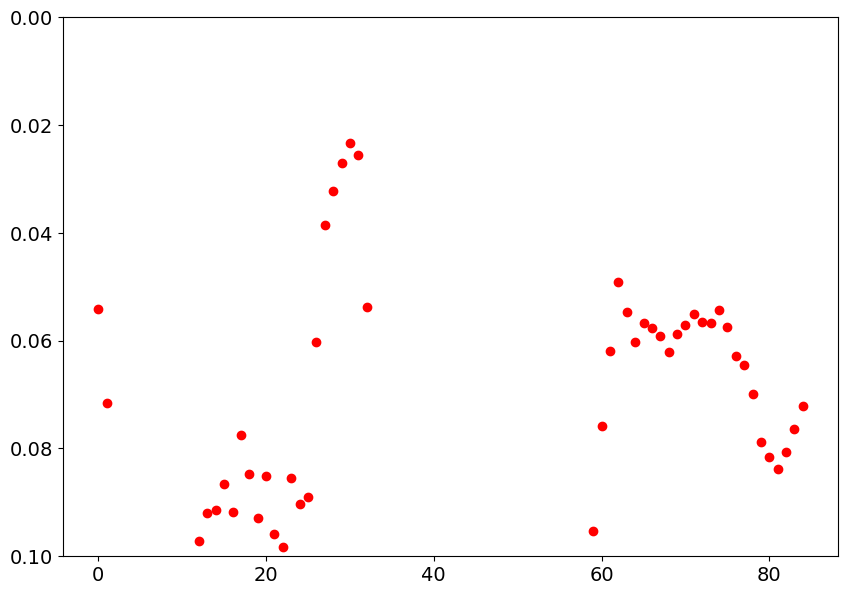

In [228]:
fig, ax = plt.subplots(figsize=(10, 7))
ax.plot(
    np.array(
        [
            f_data["p_value"]
            for f, f_data in stat_res.items()
            if f_data["model"].converged
        ]
    ),
    ls="",
    marker="o",
    c="r",
)
ax.set_ylim([0.1, 0])

In [24]:
idx = pd.IndexSlice
stat_res_overall = {}

tmp_df = hyp_df
model1 = sm.formula.mixedlm(
    "value ~ C(state, Treatment(reference='wake-all')) * C(freq) * C(channel)",
    data=tmp_df,
    groups=tmp_df.animal,
).fit(reml=False)
model2 = sm.formula.mixedlm(
    "value ~ C(state, Treatment(reference='wake-all')) * freq + C(state, Treatment(reference='wake-all')) * C(channel) + C(freq) * C(channel)",
    data=tmp_df,
    groups=tmp_df.animal,
).fit(reml=False)

model3 = sm.formula.mixedlm(
    "value ~ C(state, Treatment(reference='wake-all')) + C(freq) + C(channel) + C(state, Treatment(reference='wake-all')) : C(channel) + C(freq):C(channel)",
    data=tmp_df,
    groups=tmp_df.animal,
).fit(reml=False)
model4 = sm.formula.mixedlm(
    "value ~ C(state, Treatment(reference='wake-all')) + C(freq) + C(channel) + C(state, Treatment(reference='wake-all')) : C(freq) + C(channel):C(freq)",
    data=tmp_df,
    groups=tmp_df.animal,
).fit(reml=False)
model5 = sm.formula.mixedlm(
    "value ~ C(freq) + C(channel) + C(state, Treatment(reference='wake-all')):C(freq) + C(state, Treatment(reference='wake-all')):C(channel) + C(channel):C(freq)",
    data=tmp_df,
    groups=tmp_df.animal,
).fit(reml=False)
# model6 = sm.formula.mixedlm(
#     "value ~ C(state, Treatment(reference='wake-all'))",
#     data=tmp_df,
#     groups=tmp_df.animal,
# ).fit(reml=False)
# model7 = sm.formula.mixedlm(
#     "value ~ C(freq)",
#     data=tmp_df,
#     groups=tmp_df.animal,
# ).fit(reml=False)
# model8 = sm.formula.mixedlm(
#     "value ~ C(channel)",
#     data=tmp_df,
#     groups=tmp_df.animal,
# ).fit(reml=False)

# chi_sq_1_2 = 2 * (model1.llf - model2.llf)
# # chi_sq_2_3 = 2 * (model2.llf - model3.llf)
# # chi_sq_2_4 = 2 * (model2.llf - model4.llf)
# df_1_2 = model1.df_modelwc - model2.df_modelwc
# # df_2_3 = model2.df_modelwc - model3.df_modelwc
# # df_2_4 = model2.df_modelwc - model4.df_modelwc
# p_value_1_2 = stats.chi2.sf(chi_sq_1_2, df_1_2)
# # p_value_2_3 = stats.chi2.sf(chi_sq_2_3, df_2_3)
# # p_value_2_4 = stats.chi2.sf(chi_sq_2_4, df_2_4)
# # if p_value_2_3 < 0.05 and p_value_2_4 < 0.05:
# if p_value_1_2 < 0.05:
#     model = model1
# else:
#     model = model2
# #     else:
# #         model = model2
# # elif p_value_2_3 < 0.05:
# #     model = model3
# # elif p_value_2_4 < 0.05:
# #     model = model4

# # print(
# #     f"interaction p={p_value_1_2:.3e}"  # cond p={p_value_2_3:.3e}, state p={p_value_2_4:.3e}"
# # )
# stat_res_overall[f"{tmp_freq:.01f}"] = {
#     "model": model,
#     "p_value": p_value_1_2,
# }  # .loc[dict(state=tmp_state)] = model.wald_test_terms()

: 

In [ ]:
re_ch_dict = {
    animal: {ch.split("[")[-1][:-2]: re for ch, re in zip(animal_re.index, animal_re)}
    for animal, animal_re in model.random_effects.items()
}

Text(0.5, 0.98, 'Conditional Means per Channel Random Effects')

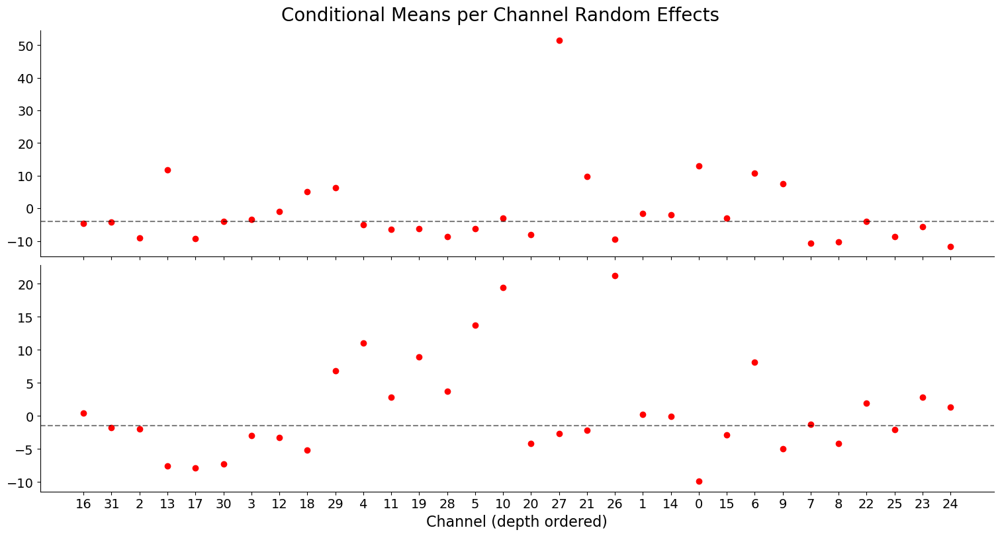

In [ ]:
fig, axs = plt.subplots(figsize=(15, 8), nrows=2, constrained_layout=True, sharex=True)
for ax, (animal, ch_res) in zip(axs.ravel(), re_ch_dict.items()):
    chs = []
    res = []
    for ch in depth_ordered_chs[::-1]:
        if ch in ch_res:
            chs.append(int(ch))
            res.append(ch_res[ch])
    ax.plot(chs, res, label=animal, ls="", marker="o", c="r")
    ax.axhline(np.median(res), ls="--", c="k", alpha=0.5)
    ax.spines[["top", "right"]].set_visible(False)
_ = ax.set_xlabel("Channel (depth ordered)")
_ = ax.set_xticks(np.arange(len(chs)), chs)
fig.suptitle("Conditional Means per Channel Random Effects")

In [22]:
idx = pd.IndexSlice
hyp_df = df_all.loc[df_all.region == "hyp", :]
channels = hyp_df.channel.unique()
freqs = hyp_df.freq.unique()
stat_res = xr.DataArray(
    data=np.nan, dims=["ch", "freq"], coords={"ch": channels, "freq": freqs}
)
ch_x_freq = list(it.product(channels, freqs))
for ch, tmp_freq in ch_x_freq[:10]:
    tmp_df = hyp_df.loc[(hyp_df.channel == ch) & (hyp_df.freq == tmp_freq), :]
    model1 = sm.formula.mixedlm(
        "value ~ C(condition, Treatment(reference='none')) * C(state, Treatment(reference='wake-all'))",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False)
    model2 = sm.formula.mixedlm(
        "value ~ C(condition, Treatment(reference='none')) + C(state, Treatment(reference='wake-all'))",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False)
    model3 = sm.formula.mixedlm(
        "value ~ C(condition, Treatment(reference='none'))",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False)
    model4 = sm.formula.mixedlm(
        "value ~ C(state, Treatment(reference='wake-all'))",
        data=tmp_df,
        groups=tmp_df.animal,
    ).fit(reml=False)
    chi_sq_1_2 = 2 * (model1.llf - model2.llf)
    chi_sq_2_3 = 2 * (model2.llf - model3.llf)
    chi_sq_2_4 = 2 * (model2.llf - model4.llf)
    df_1_2 = model1.df_modelwc - model2.df_modelwc
    df_2_3 = model2.df_modelwc - model3.df_modelwc
    df_2_4 = model2.df_modelwc - model4.df_modelwc
    p_value_1_2 = stats.chi2.sf(chi_sq_1_2, df_1_2)
    p_value_2_3 = stats.chi2.sf(chi_sq_2_3, df_2_3)
    p_value_2_4 = stats.chi2.sf(chi_sq_2_4, df_2_4)
    if p_value_2_3 < 0.05 and p_value_2_4 < 0.05:
        if p_value_1_2 < 0.05:
            model = model1
        else:
            model = model2
    elif p_value_2_3 < 0.05:
        model = model3
    elif p_value_2_4 < 0.05:
        model = model4

    print(
        f"ch {ch}, {tmp_freq:.3f} Hz: interaction p={p_value_1_2:.3e}, cond p={p_value_2_3:.3e}, state p={p_value_2_4:.3e}"
    )
    stat_res.loc[dict(ch=ch, freq=tmp_freq)] = model.wald_test_terms()

PatsyError: Error evaluating factor: NameError: name 'condition' is not defined
    value ~ C(condition, Treatment(reference='none')) * C(state, Treatment(reference='wake-all'))
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

In [ ]:
xr_dict = {}
for cond, cond_xr in cond_reg_dict.items():
    xr_dict[cond] = {}
    for reg, reg_xr in cond_xr.items():
        xr_dict[cond][reg] = {}
        for state, state_xr in reg_xr.items():
            tmp_xr = xr.concat(state_xr, dim="trial")
            xr_dict[cond][reg][state] = tmp_xr.assign_coords(
                trial=range(tmp_xr.sizes["trial"])
            )

In [ ]:
frames = []
for condition, region_dict in xr_dict.items():
    for region, state_dict in region_dict.items():
        for state, arr in state_dict.items():

            # Convert to long dataframe
            df = arr.to_dataframe(name="value").reset_index()

            # Add metadata columns
            df["condition"] = condition
            df["region"] = region
            df["state"] = state
            df["animal"] = animal

            frames.append(df)

# Concatenate
df_all = pd.concat(frames, ignore_index=True)

# Create MultiIndex
df_all = df_all.set_index(["condition", "region", "state", "channel", "freq", "trial"])

In [ ]:
ch_dict = {"ctx": ["39"], "hyp": depth_ordered_chs}
tuples = [
    (cond, state, animal, date, region, ch)
    for cond, cond_dict in full_dict.items()
    for state in ["NREM", "REM", "WAKE"]
    for animal, date in zip(cond_dict["animal"], cond_dict["dates"])
    for region in ["ctx", "hyp"]
    for ch in ch_dict[region]
]
index = pd.MultiIndex.from_tuples(
    tuples, names=["cond", "state", "animal", "date", "region", "channel"]
)
amp_df = pd.DataFrame(data=None, index=index, columns=["avg", "sem"])
for cond, state, animal, date, region, ch in amp_df.index:
    amp_df.loc[(cond, state, animal, date, region, ch)] = trace_dict[date][state][
        region
    ]["raw"][ch]

In [ ]:
idx = pd.IndexSlice
subdf = amp_df.loc[idx[:, :, :, :, "hyp", :]].reset_index()

# Convert array entries in "avg" into long rows
rows = []
for _, r in subdf.iterrows():
    avg_list = r["avg"]
    for epoch_i, arr in enumerate(avg_list):
        # arr = np.asarray(arr)
        # for sample_i, val in enumerate(arr):
        rows.append(
            {
                "value": arr,
                "epoch": epoch_i,
                "cond": r["cond"],
                "state": r["state"],
                "animal": r["animal"],
                "date": r["date"],
                # "region": r["region"],
                "channel": r["channel"],
            }
        )

df_long = pd.DataFrame(rows)

### Plotting PSDs

In [14]:
# drop_df = df_all.loc[(df_all.condition == "none"), :].drop(columns=["condition"])

reg_state_df = df_all.groupby(["freq", "state", "region"]).agg(
    {"value": ["mean", "sem"]}
)

<>:37: SyntaxWarning: invalid escape sequence '\l'
<>:37: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_329233/746833116.py:37: SyntaxWarning: invalid escape sequence '\l'
  ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")


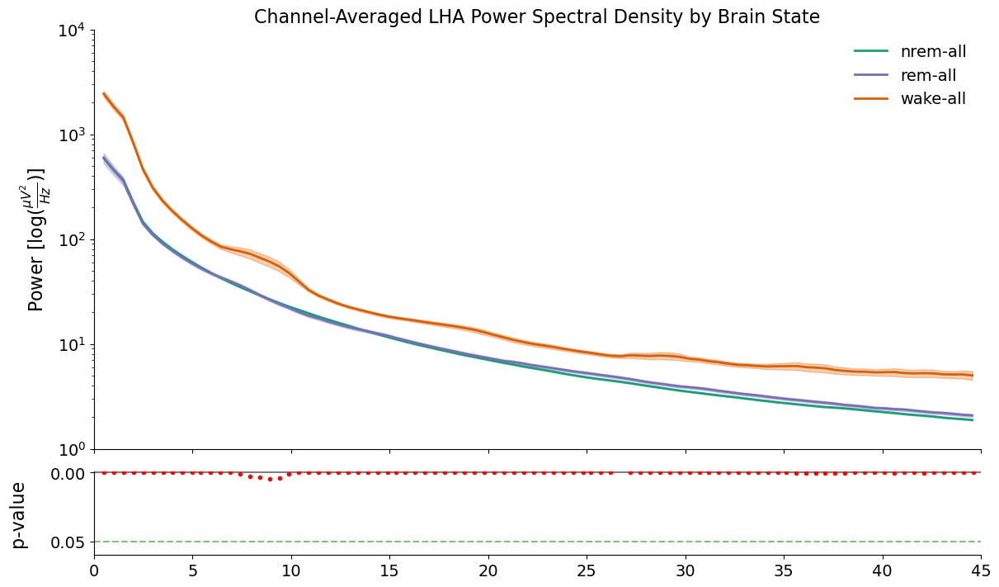

In [29]:
idx = pd.IndexSlice
state_color_dict = {"nrem-all": "#1b9e77", "rem-all": "#7570b3", "wake-all": "#d95f02"}
# state_color_dict = {"nrem-all": "#d7191c", "rem-all": "#fdae61", "wake-all": "#2c7bb6"}
# state_color_dict = {"nrem-all": "#bdc9e1", "rem-all": "#67a9cf", "wake-all": "#02818a"}
region = "hyp"
fig, axs = plt.subplots(
    nrows=2,
    figsize=(12, 7),
    constrained_layout=True,
    height_ratios=[5, 1],
    sharex=True,
)
reg_df = reg_state_df.loc[idx[:, :, region], :].reset_index()
ax = axs[0]
for state, state_df in reg_df.groupby("state"):
    ax.plot(
        state_df.freq,
        state_df.value["mean"],
        label=state,
        c=state_color_dict[state],
        lw=2,
    )
    ax.fill_between(
        x=state_df.freq,
        y1=state_df.value["mean"] - state_df.value["sem"],
        y2=state_df.value["mean"] + state_df.value["sem"],
        color=state_color_dict[state],
        alpha=0.3,
    )
    ax.set_yscale("log")
    # ax.set_xscale("log")
ax.set_xlim([0, 45])
ax.set_ylim([10e-1, 10e3])
ax.legend(frameon=False)
ax.spines[["top", "right"]].set_visible(False)
ax.set_title("Channel-Averaged LHA Power Spectral Density by Brain State")
ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$")
ax = axs[1]
p_vals = {
    float(f): f_data["p_value"]
    for f, f_data in stat_res.items()
    if f_data["model"].converged
}
ax.axhline(0.0, ls="-", c="k", alpha=0.5)
ax.axhline(0.05, ls="--", c="g", alpha=0.5)
ax.plot(
    np.array(list(p_vals.keys()), dtype=float),
    np.array(list(p_vals.values())),
    ls="",
    marker=".",
    c="r",
)
ax.spines[["top", "right"]].set_visible(False)
ax.set_ylim([0.06, -0.001])
ax.set_ylabel("p-value", labelpad=20)
fig.savefig(
    Path(
        "/gpfs01/born/animal/DanielG/hypo_sleep/figures/",
        "hyp_psd_state_stats_HYDO01-4.png",
    ),
    dpi=400,
    facecolor="white",
    transparent=False,
    bbox_inches="tight",
)

In [20]:
stat_res["15.0"]

KeyError: '15.0'

<>:66: SyntaxWarning: invalid escape sequence '\l'
<>:66: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_3314735/2123702982.py:66: SyntaxWarning: invalid escape sequence '\l'
  fig.supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)


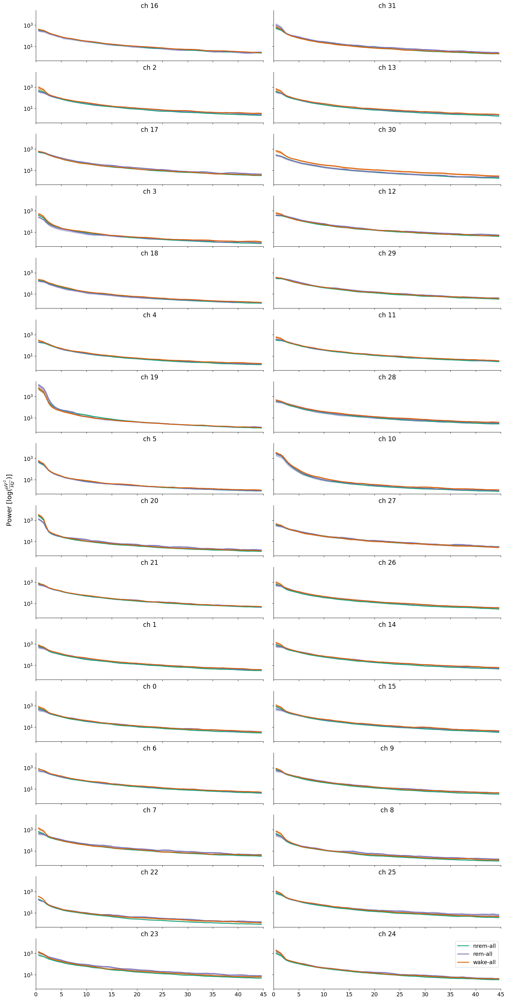

In [49]:
state_color_dict = {"nrem-all": "#1b9e77", "rem-all": "#7570b3", "wake-all": "#d95f02"}
# for cond, cond_xr in xr_dict.items():
fig, axs = plt.subplots(
    nrows=16,
    ncols=2,
    figsize=(17, 35),
    constrained_layout=True,
    sharex=True,
    sharey=True,
)
reg_df = drop_df.loc[drop_df.region == "hyp", :]
for ch, ax in zip(depth_ordered_chs[::-1], axs.ravel()):
    ch_df = reg_df.loc[reg_df.channel == ch, :]
    for state in triggers:
        state_ch_df = ch_df.loc[ch_df.state == state, :]
        state_ch_summ = state_ch_df.groupby(["freq"]).agg({"value": ["mean", "sem"]})
        ax.plot(
            state_ch_summ.index,
            state_ch_summ.value["mean"],
            label=state,
            c=state_color_dict[state],
            lw=2,
        )
        ax.fill_between(
            x=state_ch_summ.index,
            y1=state_ch_summ.value["mean"] - state_ch_summ.value["sem"],
            y2=state_ch_summ.value["mean"] + state_ch_summ.value["sem"],
            color=state_color_dict[state],
            alpha=0.4,
        )
    ax.set_title(f"ch {ch}")
    ax.set_yscale("log")
    ax.spines[["top", "right"]].set_visible(False)
    ax.set_xlim([0, 45])
ax.legend()

# for trig, trig_xr in reg_df.items():
#     for ax, ch in zip(axs.ravel(), depth_ordered_chs):
#         ax.plot(
#             trig_xr.freq,
#             trig_xr.sel(channel=ch).mean(dim="trial"),
#             label=trig,
#             c=color_dict[trig],
#             lw=1,
#         )
#         tmp_sem = trig_xr.sel(channel=ch).std(dim="trial") / np.sqrt(
#             trig_xr.sizes["trial"]
#         )
#         ax.fill_between(
#             trig_xr.freq,
#             y1=trig_xr.sel(channel=ch).mean(dim="trial") - tmp_sem,
#             y2=trig_xr.sel(channel=ch).mean(dim="trial") + tmp_sem,
#             color=color_dict[trig],
#             alpha=0.4,
#         )
#         ax.set_title(f"ch {ch}")
#         ax.set_yscale("log")
#         ax.spines[["top", "right"]].set_visible(False)
#         # ax.set_xscale("log")
#         ax.set_xlim([0, 100])
#         ax.set_ylim([1e-1, 1e5])
# axs.ravel()[-1].legend()
# axs.ravel()[-2].set_xlabel("Frequency (Hz)")
# axs.ravel()[-1].set_xlabel("Frequency (Hz)")
# fig.suptitle(f"{cond} - across brain states; Depth-Sorted")
fig.supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)
fig.savefig(
    Path(f"/gpfs01/born/animal/DanielG/hypo_sleep/figures/ch-wise_PSD_xstates_hyp.png"),
    facecolor="white",
    transparent=False,
    bbox_inches="tight",
    dpi=500,
)

In [52]:
edges = np.arange(0, 175, 1)

<>:36: SyntaxWarning: invalid escape sequence '\l'
<>:36: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_3314735/2222605789.py:36: SyntaxWarning: invalid escape sequence '\l'
  fig.supxlabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", y=-0.02)


Text(0.5, -0.02, 'Power $[\\log(\\frac{\\mu V^{2}}{Hz})]$')

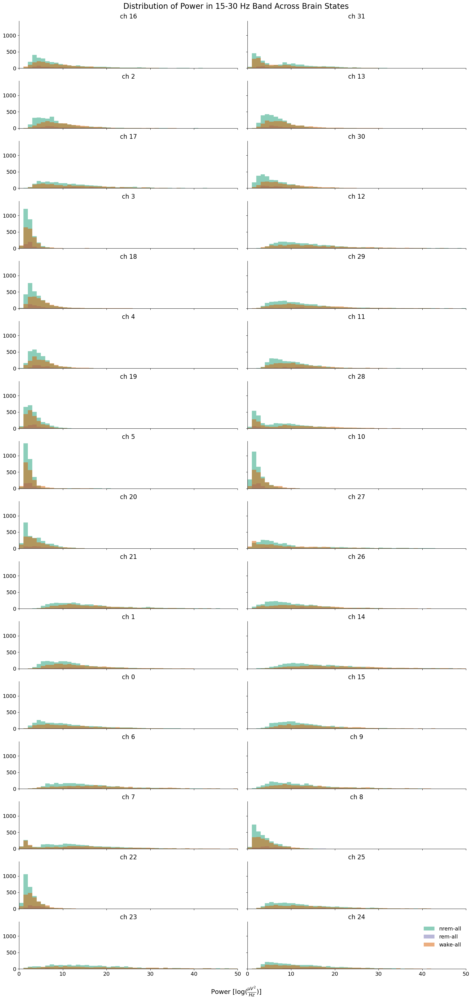

In [62]:
freq_oi = slice(15, 30)
fig, axs = plt.subplots(
    nrows=16,
    ncols=2,
    figsize=(17, 35),
    constrained_layout=True,
    sharex=True,
    sharey=True,
)
reg_df = drop_df.loc[drop_df.region == "hyp", :]
for ch, ax in zip(depth_ordered_chs[::-1], axs.ravel()):
    ch_df = reg_df.loc[reg_df.channel == ch, :]
    for state in triggers:
        state_ch_df = ch_df.loc[ch_df.state == state, :]
        state_ch_summ = state_ch_df.groupby(["freq", "epoch"]).agg(
            {"value": ["mean", "sem"]}
        )
        obs = state_ch_summ.loc[freq_oi, :, :].value["mean"]
        _ = ax.hist(
            obs,
            bins=edges,
            # density=True,
            alpha=0.5,
            color=state_color_dict[state],
            label=state,
        )
    ax.set_title(f"ch {ch}")
    # ax.set_yscale("log")
    ax.spines[["top", "right"]].set_visible(False)
    ax.set_xlim([0, 50])
ax.legend(frameon=False)
fig.suptitle(
    f"Distribution of Power in {freq_oi.start}-{freq_oi.stop} Hz Band Across Brain States",
    y=1.01,
)
fig.supxlabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", y=-0.02)

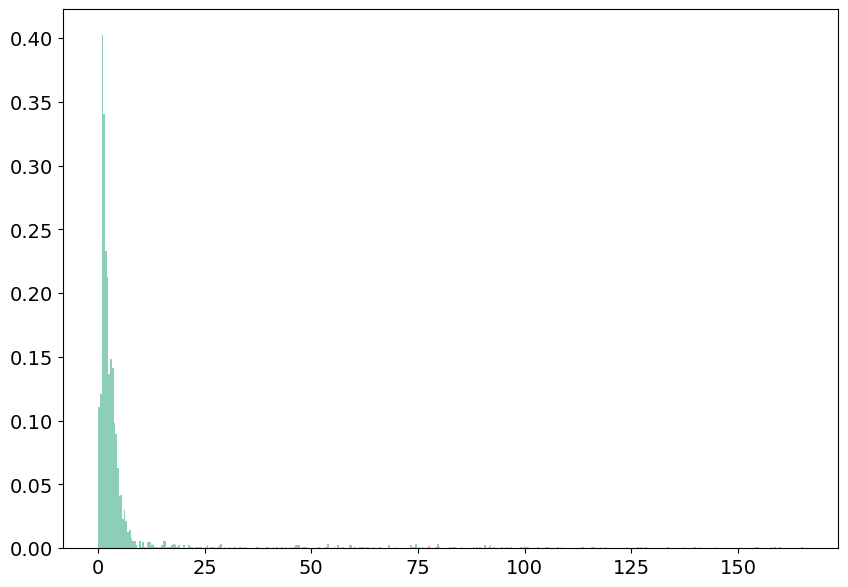

In [37]:
fig, ax = plt.subplots(figsize=(10, 7))
freq_oi = slice(20, 30)
obs = state_ch_summ.loc[freq_oi, :, :].value["mean"]
_ = ax.hist(obs, bins="fd", density=True, alpha=0.5, color=state_color_dict[state])

In [ ]:
fig, ax = plt.subplots(figsize=(10, 7))
freq_oi = slice(20, 30)
# state_ch_summ.loc[freq_oi, :, :]
ax.hist(state_ch_summ.loc[freq_oi, :, :])

In [28]:
state_ch_summ

value             
                   mean          sem
freq epoch                          
0.5  0      1427.302088  1385.920231
     1       260.870106   240.987351
     2      4262.757266  4241.497802
     3      2557.592023  2526.430921
     4       831.839834   808.630939
...                 ...          ...
44.6 103       1.090571          NaN
     104       1.401345          NaN
     105       0.632705          NaN
     106       0.905688          NaN
     107       0.849701          NaN

[9720 rows x 2 columns]

<>:30: SyntaxWarning: invalid escape sequence '\l'
<>:30: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_1549614/350920794.py:30: SyntaxWarning: invalid escape sequence '\l'
  ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)


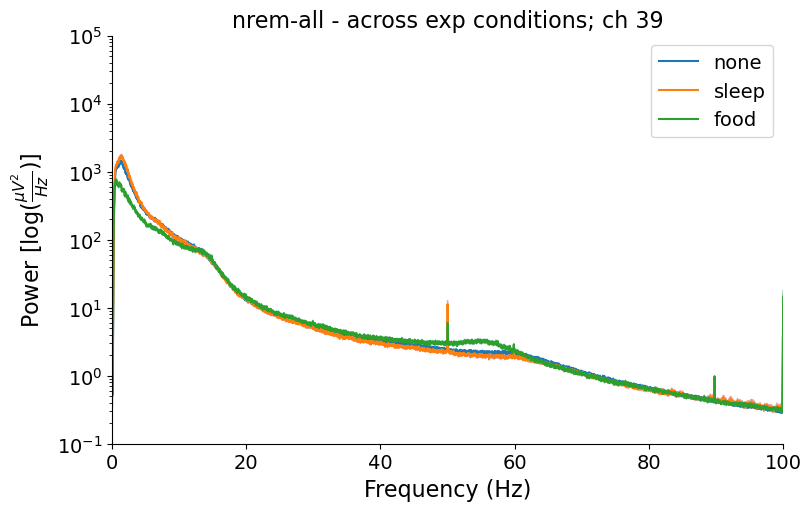

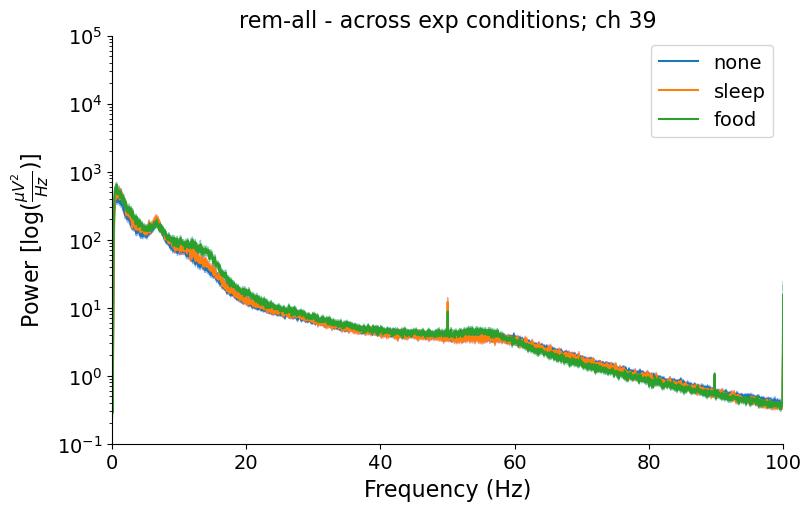

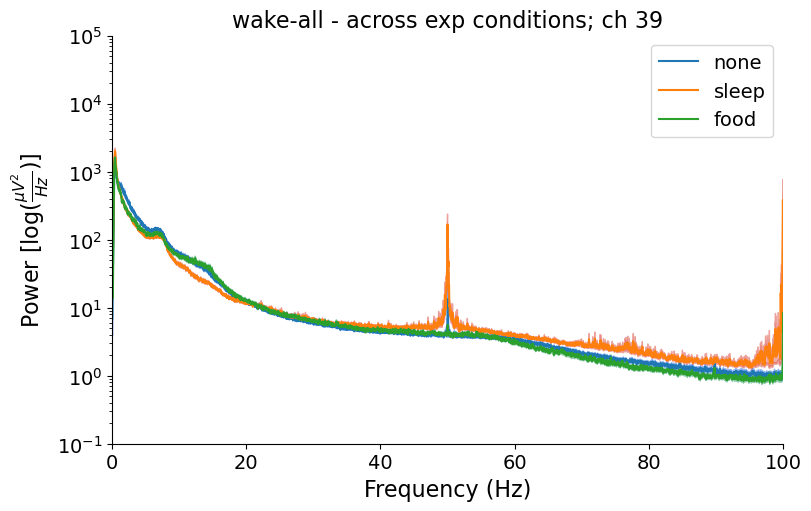

In [ ]:
axs_dict = {
    state: plt.subplots(nrows=1, figsize=(8, 5), constrained_layout=True)
    for state in ["nrem-all", "rem-all", "wake-all"]
}
color_dict = {
    state: col
    for state, col in zip(["none", "sleep", "food"], ["#0057e7", "#d62d20", "#008744"])
}
for cond, cond_xr in xr_dict.items():
    reg_xr = cond_xr["ctx"]
    for state, state_xr in reg_xr.items():
        ax = axs_dict[state][1]
        ax.plot(state_xr.freq, state_xr.sel(channel="39").mean(dim="trial"), label=cond)
        tmp_sem = state_xr.sel(channel="39").std(dim="trial") / np.sqrt(
            state_xr.sizes["trial"]
        )
        ax.fill_between(
            state_xr.freq,
            y1=state_xr.sel(channel="39").mean(dim="trial") - tmp_sem,
            y2=state_xr.sel(channel="39").mean(dim="trial") + tmp_sem,
            color=color_dict[cond],
            alpha=0.4,
        )
        ax.set_title(f"{state} - across exp conditions; ch 39")
        ax.set_yscale("log")
        ax.set_xlim([0, 100])
        ax.set_ylim([1e-1, 1e5])
        ax.spines[["top", "right"]].set_visible(False)
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)
for state, ax in axs_dict.items():
    ax[1].legend()
    ax[0].savefig(
        Path(
            f"/gpfs01/born/animal/DanielG/hypo_sleep/figures/{state}_PSD_xconds_ctx.png"
        ),
        facecolor="white",
        transparent=False,
        bbox_inches="tight",
        dpi=600,
    )

<>:32: SyntaxWarning: invalid escape sequence '\l'
<>:32: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_1549614/2011953939.py:32: SyntaxWarning: invalid escape sequence '\l'
  ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)


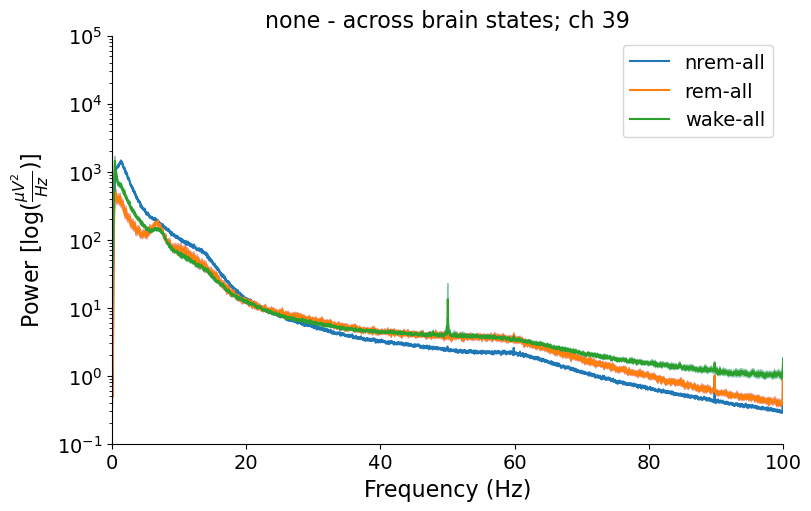

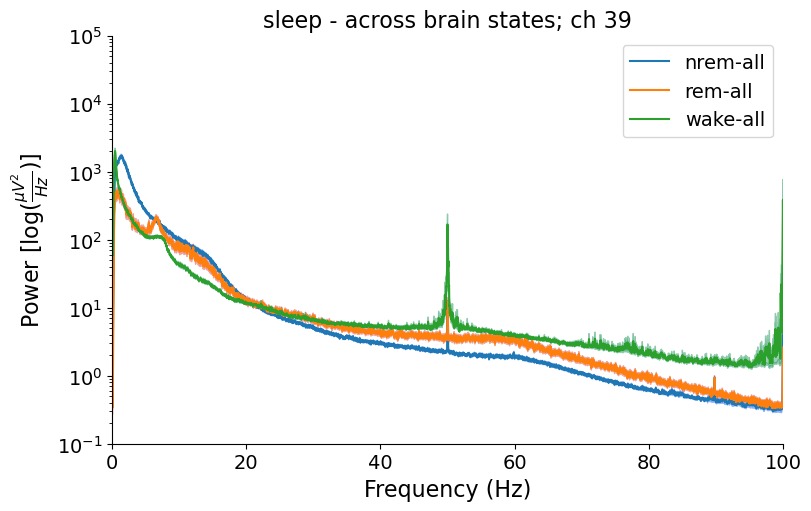

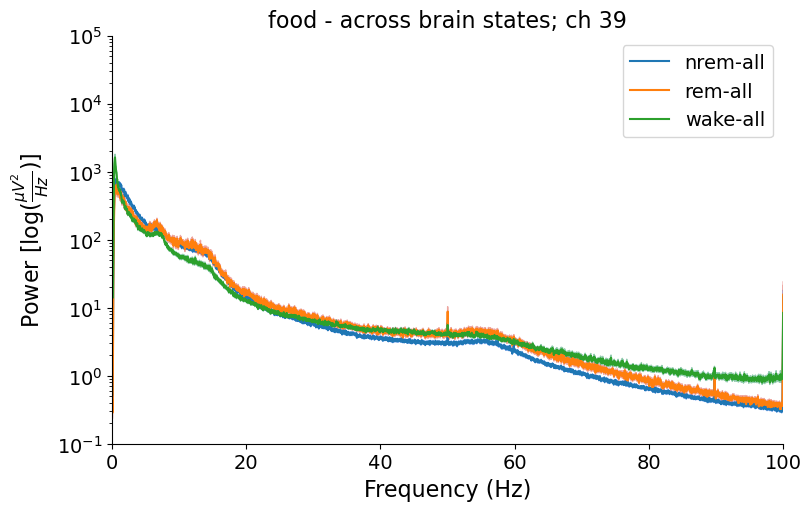

In [ ]:
color_dict = {
    trig: col for trig, col in zip(triggers, ["#0057e7", "#d62d20", "#008744"])
}

for cond, cond_xr in xr_dict.items():
    fig, ax = plt.subplots(
        figsize=(8, 5),
        constrained_layout=True,
        sharex=True,
        sharey=True,
    )
    reg_xr = cond_xr["ctx"]
    for state, state_xr in reg_xr.items():
        ax.plot(
            state_xr.freq, state_xr.sel(channel="39").mean(dim="trial"), label=state
        )
        tmp_sem = state_xr.sel(channel="39").std(dim="trial") / np.sqrt(
            state_xr.sizes["trial"]
        )
        ax.fill_between(
            state_xr.freq,
            y1=state_xr.sel(channel="39").mean(dim="trial") - tmp_sem,
            y2=state_xr.sel(channel="39").mean(dim="trial") + tmp_sem,
            color=color_dict[state],
            alpha=0.4,
        )
        ax.set_title(f"{cond} - across brain states; ch 39")
        ax.set_yscale("log")
        ax.set_xlim([0, 100])
        ax.set_ylim([1e-1, 1e5])
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)
        ax.spines[["top", "right"]].set_visible(False)
        ax.legend()
    fig.savefig(
        Path(
            f"/gpfs01/born/animal/DanielG/hypo_sleep/figures/{cond}_PSD_xstates_ctx.png"
        ),
        facecolor="white",
        transparent=False,
        bbox_inches="tight",
        dpi=600,
    )

<>:47: SyntaxWarning: invalid escape sequence '\l'
<>:47: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_1549614/163492383.py:47: SyntaxWarning: invalid escape sequence '\l'
  axs[0].supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)


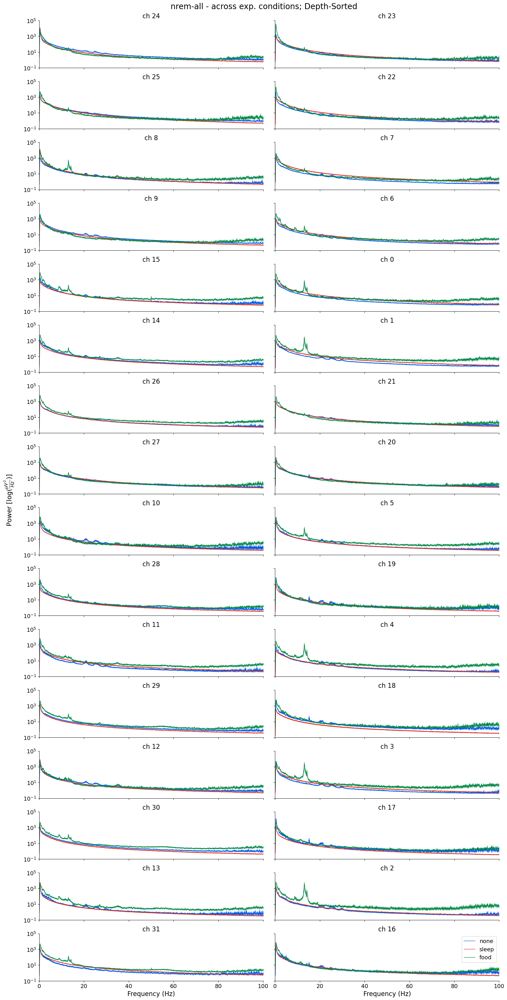

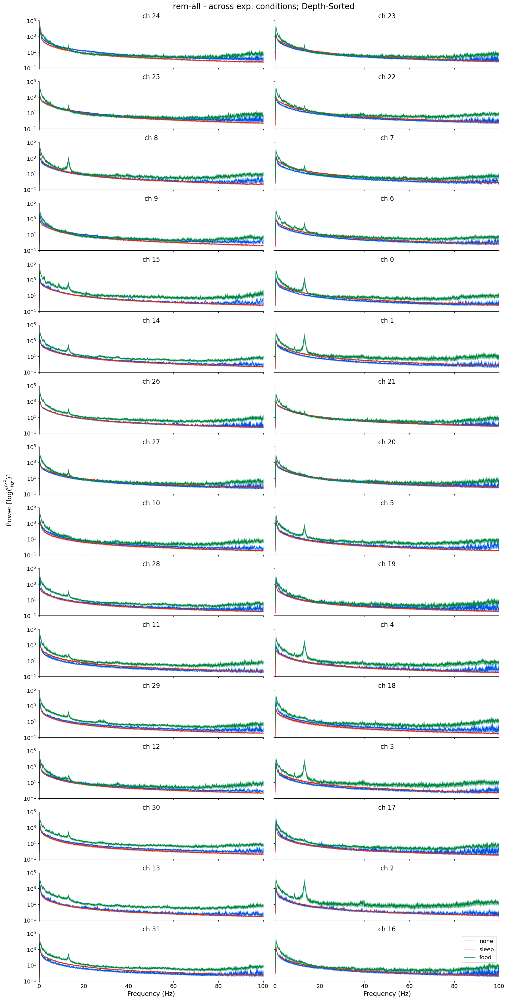

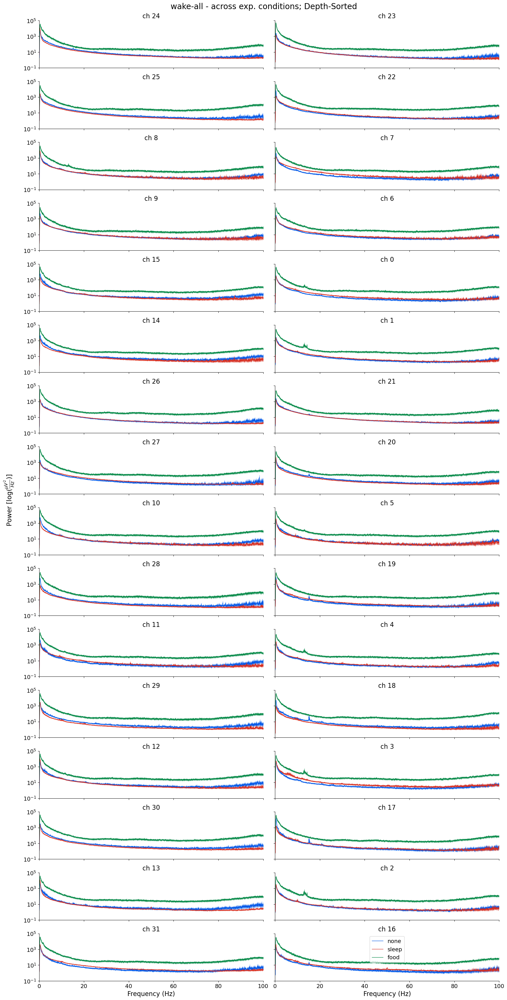

In [ ]:
axs_dict = {
    state: plt.subplots(
        nrows=16,
        ncols=2,
        figsize=(17, 35),
        constrained_layout=True,
        sharex=True,
        sharey=True,
    )
    for state in ["nrem-all", "rem-all", "wake-all"]
}
color_dict = {
    state: col
    for state, col in zip(["none", "sleep", "food"], ["#0057e7", "#d62d20", "#008744"])
}
for cond, cond_xr in xr_dict.items():
    reg_xr = cond_xr["hyp"]
    for state, state_xr in reg_xr.items():
        for ax, ch in zip(axs_dict[state][1].ravel(), depth_ordered_chs):
            ax.plot(
                state_xr.freq,
                state_xr.sel(channel=ch).mean(dim="trial"),
                label=cond,
                c=color_dict[cond],
                lw=1,
            )
            tmp_sem = state_xr.sel(channel=ch).std(dim="trial") / np.sqrt(
                state_xr.sizes["trial"]
            )
            ax.fill_between(
                state_xr.freq,
                y1=state_xr.sel(channel=ch).mean(dim="trial") - tmp_sem,
                y2=state_xr.sel(channel=ch).mean(dim="trial") + tmp_sem,
                color=color_dict[cond],
                alpha=0.4,
            )
            ax.set_title(f"ch {ch}")
            ax.set_yscale("log")
            ax.spines[["top", "right"]].set_visible(False)
            # ax.set_xscale("log")
            ax.set_xlim([0, 100])
            ax.set_ylim([1e-1, 1e5])
for axs in axs_dict.values():
    axs[1].ravel()[-1].legend()
    axs[1].ravel()[-2].set_xlabel("Frequency (Hz)")
    axs[1].ravel()[-1].set_xlabel("Frequency (Hz)")
    axs[0].supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)
for state, fig in axs_dict.items():
    fig[0].suptitle(f"{state} - across exp. conditions; Depth-Sorted")
    fig[0].savefig(
        Path(
            f"/gpfs01/born/animal/DanielG/hypo_sleep/figures/{state}_PSD_xconds_hyp.png"
        ),
        facecolor="white",
        transparent=False,
        bbox_inches="tight",
        dpi=600,
    )

<>:43: SyntaxWarning: invalid escape sequence '\l'
<>:43: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_1549614/1842232033.py:43: SyntaxWarning: invalid escape sequence '\l'
  fig.supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)


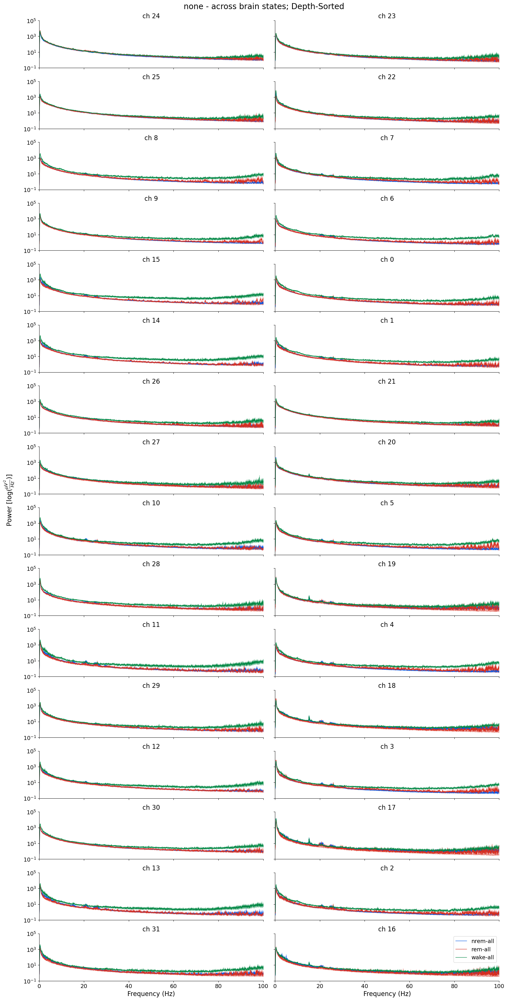

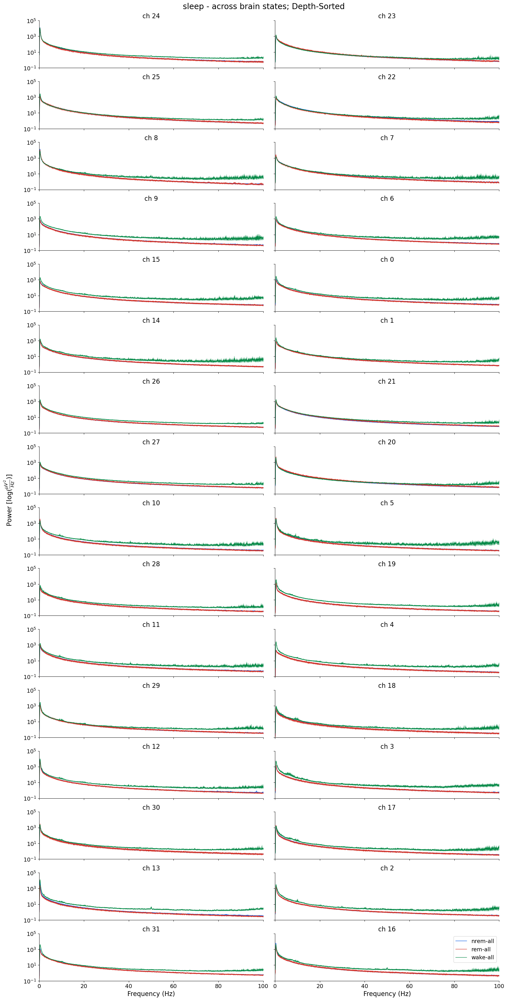

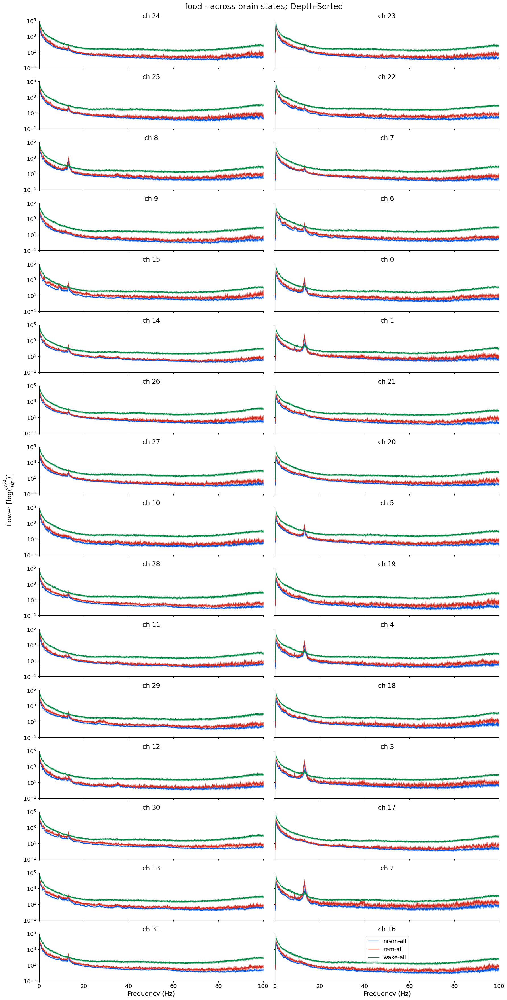

In [ ]:
color_dict = {
    trig: col for trig, col in zip(triggers, ["#0057e7", "#d62d20", "#008744"])
}
for cond, cond_xr in xr_dict.items():
    fig, axs = plt.subplots(
        nrows=16,
        ncols=2,
        figsize=(17, 35),
        constrained_layout=True,
        sharex=True,
        sharey=True,
    )
    reg_xr = cond_xr["hyp"]
    for trig, trig_xr in reg_xr.items():
        for ax, ch in zip(axs.ravel(), depth_ordered_chs):
            ax.plot(
                trig_xr.freq,
                trig_xr.sel(channel=ch).mean(dim="trial"),
                label=trig,
                c=color_dict[trig],
                lw=1,
            )
            tmp_sem = trig_xr.sel(channel=ch).std(dim="trial") / np.sqrt(
                trig_xr.sizes["trial"]
            )
            ax.fill_between(
                trig_xr.freq,
                y1=trig_xr.sel(channel=ch).mean(dim="trial") - tmp_sem,
                y2=trig_xr.sel(channel=ch).mean(dim="trial") + tmp_sem,
                color=color_dict[trig],
                alpha=0.4,
            )
            ax.set_title(f"ch {ch}")
            ax.set_yscale("log")
            ax.spines[["top", "right"]].set_visible(False)
            # ax.set_xscale("log")
            ax.set_xlim([0, 100])
            ax.set_ylim([1e-1, 1e5])
    axs.ravel()[-1].legend()
    axs.ravel()[-2].set_xlabel("Frequency (Hz)")
    axs.ravel()[-1].set_xlabel("Frequency (Hz)")
    fig.suptitle(f"{cond} - across brain states; Depth-Sorted")
    fig.supylabel("Power $[\log(\\frac{\mu V^{2}}{Hz})]$", x=-0.04)
    fig.savefig(
        Path(
            f"/gpfs01/born/animal/DanielG/hypo_sleep/figures/{cond}_PSD_xstates_hyp.png"
        ),
        facecolor="white",
        transparent=False,
        bbox_inches="tight",
        dpi=600,
    )

In [ ]:
xr_dict["none"]["hyp"]["nrem-all"]

<xarray.DataArray (channel: 32, trial: 673, freq: 11250)> Size: 2GB
array([[[9.06127275e-01, 9.26444496e-01, 9.87497741e-01, ...,
         1.66375833e-06, 1.65762210e-06, 1.66393786e-06],
        [4.58832113e-01, 4.59789443e-01, 4.83220993e-01, ...,
         1.26828361e-04, 1.27227739e-04, 1.26972263e-04],
        [9.45797029e-01, 9.50178699e-01, 1.03176305e+00, ...,
         1.55345711e-04, 1.55421639e-04, 1.55437183e-04],
        ...,
        [7.31729820e-02, 7.36338370e-02, 8.41141827e-02, ...,
         6.85567016e-06, 6.85884083e-06, 6.87490690e-06],
        [4.56237710e-02, 5.04708518e-02, 6.33885596e-02, ...,
         1.94907212e-06, 1.95116889e-06, 1.93509084e-06],
        [6.77736821e-02, 6.67634532e-02, 7.86418751e-02, ...,
         6.75395200e-06, 6.74684125e-06, 6.76541353e-06]],

       [[3.70842119e-01, 3.78523944e-01, 4.05789908e-01, ...,
         2.75041373e-06, 2.75856083e-06, 2.74887607e-06],
        [8.22147763e-02, 8.41713823e-02, 9.20829714e-02, ...,
         2.50400629e-06, 2.54706816e-06, 2.52890975e-06],
        [1.95440727e-02, 1.96222058e-02, 2.10619346e-02, ...,
         2.97133582e-04, 2.97223007e-04, 2.97212109e-04],
...
        [2.60213673e-01, 2.71768211e-01, 2.78446950e-01, ...,
         2.61177217e-05, 2.61746921e-05, 2.61590665e-05],
        [4.61045079e-02, 4.68710536e-02, 5.36411135e-02, ...,
         9.13277239e-07, 9.13751578e-07, 9.00930496e-07],
        [7.73265820e-03, 7.79012598e-03, 9.77580265e-03, ...,
         6.65587140e-06, 6.66472656e-06, 6.64235280e-06]],

       [[2.34725159e-01, 2.40463149e-01, 2.59395064e-01, ...,
         1.68251351e-04, 1.68184906e-04, 1.68255700e-04],
        [5.85024915e-01, 5.95699588e-01, 6.31638293e-01, ...,
         9.43418555e-05, 9.42296384e-05, 9.44252219e-05],
        [5.77458882e-02, 5.79293747e-02, 6.37060708e-02, ...,
         1.09090862e-04, 1.09136191e-04, 1.09121139e-04],
        ...,
        [2.70895380e-01, 2.78730154e-01, 2.92705826e-01, ...,
         4.57057043e-06, 4.58918994e-06, 4.59360451e-06],
        [3.76516900e-02, 4.24215755e-02, 8.14995063e-02, ...,
         1.49095242e-05, 1.48874719e-05, 1.48857289e-05],
        [7.43902035e-03, 7.32280447e-03, 8.35788079e-03, ...,
         5.41841374e-06, 5.42228723e-06, 5.41024312e-06]]])
Coordinates:
  * channel     (channel) <U2 256B '26' '27' '10' '28' ... '19' '5' '20' '21'
  * freq        (freq) float64 90kB 0.0 0.01111 0.02222 ... 125.0 125.0 125.0
    timestamps  (trial) float64 5kB 356.0 656.0 736.0 ... 2.137e+04 2.146e+04
  * trial       (trial) int64 5kB 0 1 2 3 4 5 6 ... 666 667 668 669 670 671 672

In [ ]:
## From chatgpt

# df: DataFrame with columns Y, Condition (categorical), Subject (categorical)
model = smf.ols("Y ~ C(Condition) + C(Subject)", data=df).fit()
print(model.summary())

# ANOVA table for Condition
anova_res = sm.stats.anova_lm(model, typ=2)  # or typ=3 if preferred
print(anova_res.loc["C(Condition)"])


# Permutation test: shuffle Condition within each Subject
def obs_stat(df):
    m = smf.ols("Y ~ C(Condition) + C(Subject)", data=df).fit()
    anova_res = sm.stats.anova_lm(m, typ=2)
    return anova_res.loc["C(Condition)", "F"]


obs_f = obs_stat(df)

rng = np.random.default_rng(123)
nperm = 5000
perm_f = np.empty(nperm)
for i in range(nperm):
    dfp = df.copy()
    # permute Condition labels within each subject
    dfp["Condition"] = df.groupby("Subject")["Condition"].transform(
        lambda x: rng.permutation(x.values)
    )
    perm_f[i] = obs_stat(dfp)

p_value = np.mean(perm_f >= obs_f)
print("Permutation p-value:", p_value)

In [ ]:
import statsmodels.formula.api as smf

In [ ]:
condition ~ fixed effect
subject ~ random effect
smf.mixedlm()

In [ ]:
model = smf.mixedlm("Y ~ C(Condition)", data=df, groups=df["Subject"])
result = model.fit()
print(result.summary())

# Pairwise comparisons:
import pingouin as pg

pg.pairwise_ttests(dv="Y", within="Condition", subject="Subject", data=df)

In [ ]:
sm.MixedLM()

<module 'statsmodels.api' from '/gpfs01/born/user/dgramling/miniforge3/envs/hypo-sleep-no-si/lib/python3.12/site-packages/statsmodels/api.py'>